## Reading the data

In [1]:
import pandas as pd
import numpy as np
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE


df = pd.read_csv("../../corpus_sprint3_balanced_cleaned_all.csv", encoding="utf-8")
df = df.dropna()
print(df)
print(df.shape)

model = Doc2Vec.load("../../model_doc2vec_balanced_20epochs")

        Row No Date received                  Product  \
446       6874      09/09/16              Payday loan   
713      10840      08/07/15            Consumer Loan   
803      12248      08/07/16            Consumer Loan   
1153     17162      05/26/16            Consumer Loan   
1185     17642      11/05/15            Consumer Loan   
...        ...           ...                      ...   
126588  222826      09/21/16  Bank account or service   
126589  142174      03/05/16  Bank account or service   
126590   55888      01/23/17  Bank account or service   
126591  293505      09/27/16  Bank account or service   
126592  327087      09/28/15  Bank account or service   

                       Sub-product                                     Issue  \
446                           None  Charged fees or interest I didn't expect   
713                   Vehicle loan       Problems when you are unable to pay   
803                   Vehicle loan                Managing the loan or leas

In [2]:
df_concat = model.docvecs.vectors_docs

## Applying UMAP

In [3]:
import umap
data_reduced = umap.UMAP().fit_transform(df_concat)

C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\umap\spectral.py:4: NumbaDeprecationWarning: No direct replacement for 'numba.targets' available. Visit https://gitter.im/numba/numba-dev to request help. Thanks!
  import numba.targets
C:\Users\l-Larsovic-l\anaconda3\lib\importlib\__init__.py:127: NumbaDeprecationWarning: An import was requested from a module that has moved location.
Import requested from: 'numba.targets.registry', please update to use 'numba.core.registry' or pin to Numba version 0.48.0. This alias will not be present in Numba version 0.50.0.
  return _bootstrap._gcd_import(name[level:], package, level)
C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\umap\spectral.py:106: NumbaDeprecationWarning: An import was requested from a module that has moved location.
Import of 'CPUDispatcher' requested from: 'numba.targets.registry', please update to use 'numba.core.registry' or pin to Numba version 0.48.0. This alias will not be present in Numba version 0.50.0.
  ) == numba

In [4]:
print(data_reduced.shape)

(58035, 2)


## Applying k-means

In [5]:
from sklearn.cluster import KMeans
from sklearn import metrics

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49


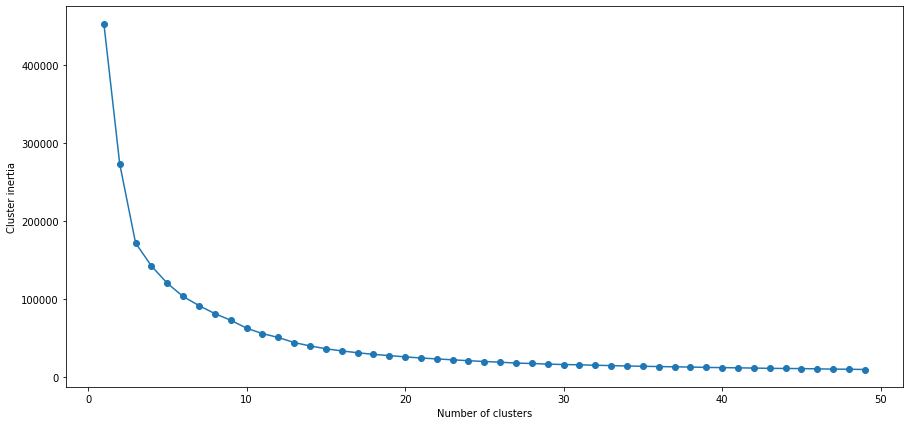

In [6]:
inertia = []
k_min=1
k_max=50
for i in range(k_min, k_max):
    print(i)
    km = KMeans(n_clusters=i,init='k-means++')
    km.fit(data_reduced)
    inertia.append(km.inertia_)
plt.rcParams['figure.figsize'] = [15,7]
plt.plot(range(k_min,k_max), inertia,marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Cluster inertia')
plt.show()

## Silhouette scores

For n_clusters = 4 The average silhouette_score is : 0.37565243
For n_clusters = 5 The average silhouette_score is : 0.35444003
For n_clusters = 6 The average silhouette_score is : 0.35809463
For n_clusters = 7 The average silhouette_score is : 0.3555347
For n_clusters = 8 The average silhouette_score is : 0.36976537
For n_clusters = 9 The average silhouette_score is : 0.36594996
For n_clusters = 10 The average silhouette_score is : 0.3752865
For n_clusters = 11 The average silhouette_score is : 0.39338905
For n_clusters = 12 The average silhouette_score is : 0.38166142
For n_clusters = 13 The average silhouette_score is : 0.3869766
For n_clusters = 14 The average silhouette_score is : 0.39137584
For n_clusters = 15 The average silhouette_score is : 0.39900348
For n_clusters = 16 The average silhouette_score is : 0.40022478
For n_clusters = 17 The average silhouette_score is : 0.39537728
For n_clusters = 18 The average silhouette_score is : 0.39540792
For n_clusters = 19 The average si

C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 24 The average silhouette_score is : 0.40110266


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 25 The average silhouette_score is : 0.40046257


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 26 The average silhouette_score is : 0.4048153


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 27 The average silhouette_score is : 0.40541923


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 28 The average silhouette_score is : 0.40464932


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 29 The average silhouette_score is : 0.39352015


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 30 The average silhouette_score is : 0.3932536


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 31 The average silhouette_score is : 0.39173323


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 32 The average silhouette_score is : 0.3867377


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 33 The average silhouette_score is : 0.38492087


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 34 The average silhouette_score is : 0.3805608


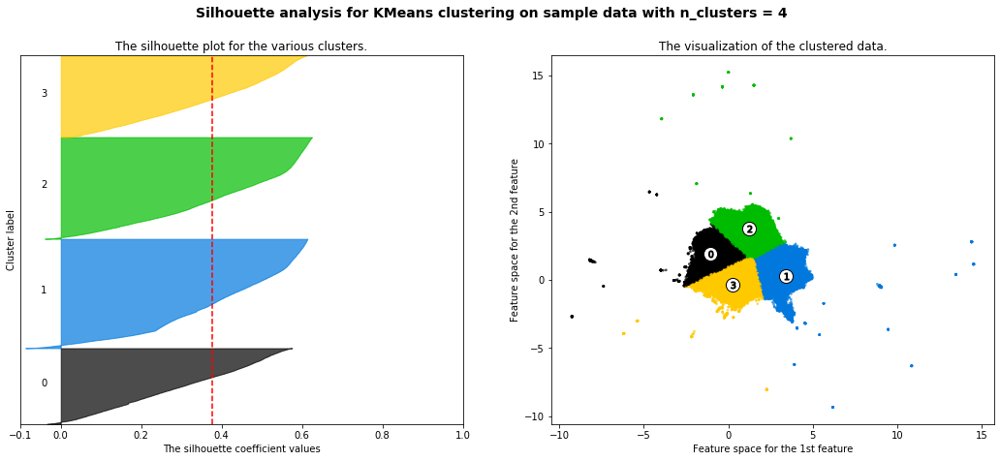

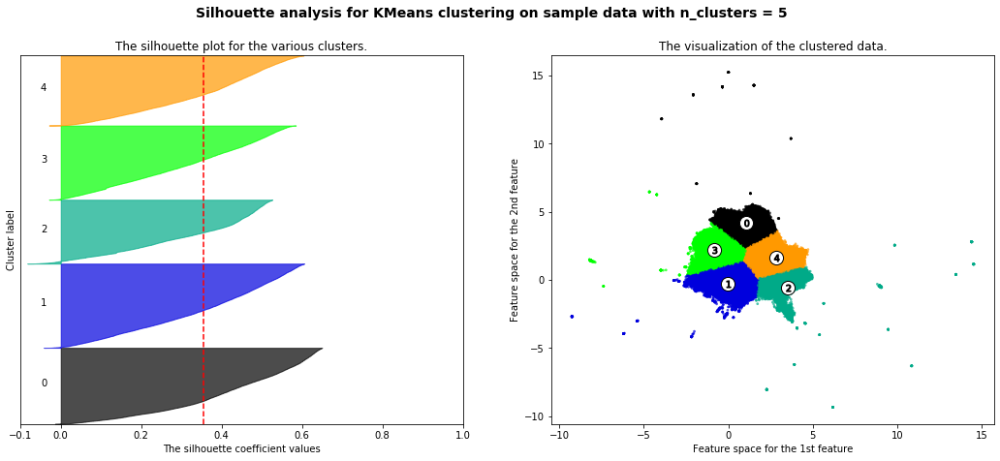

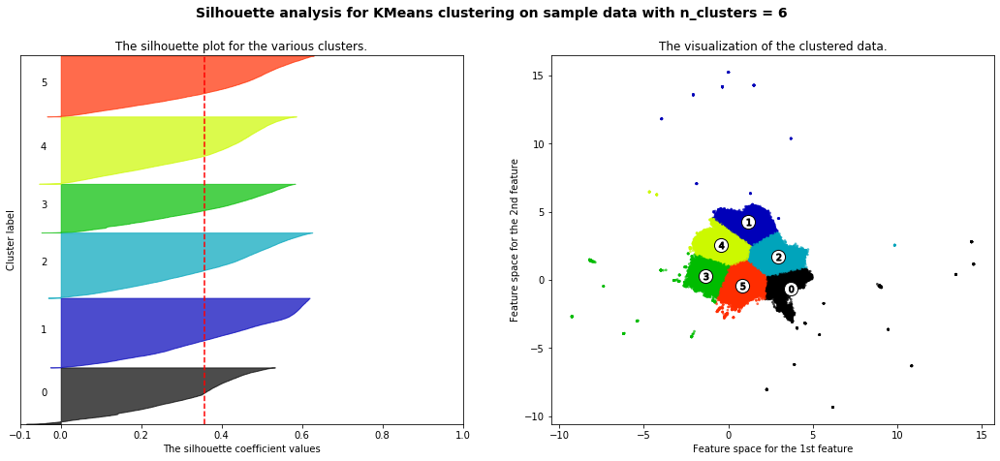

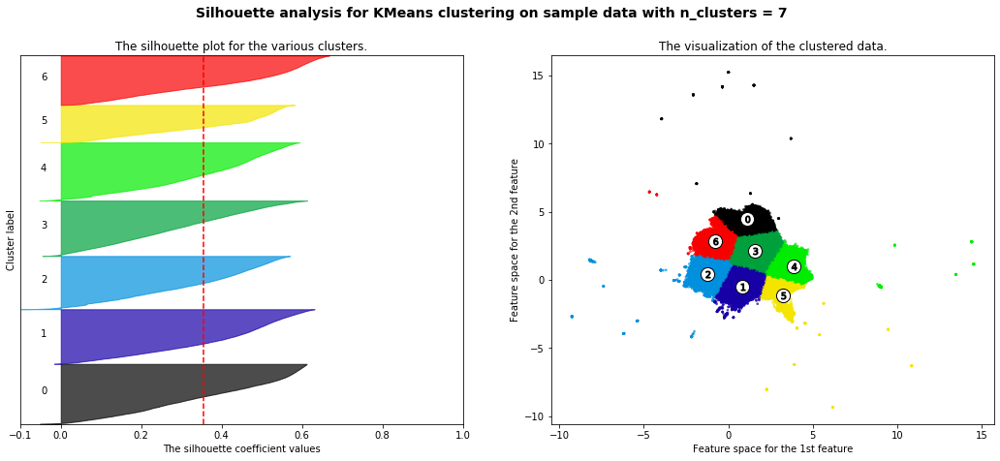

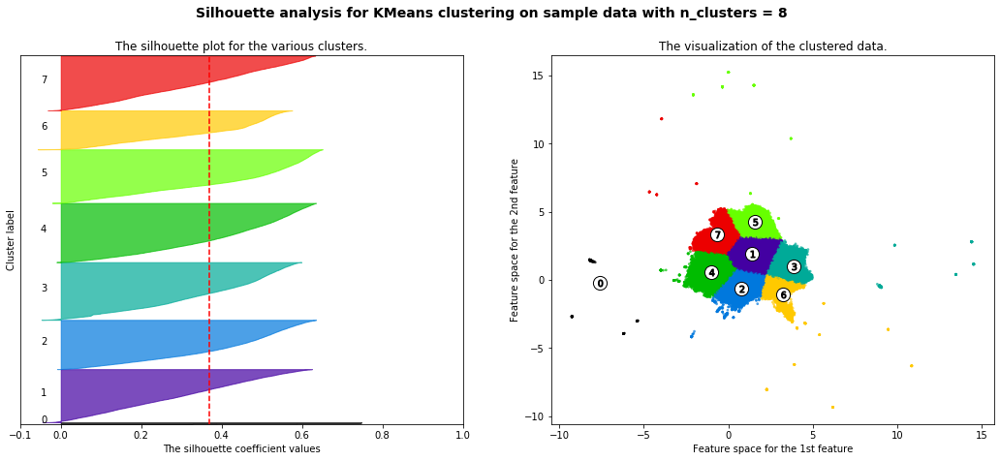

...

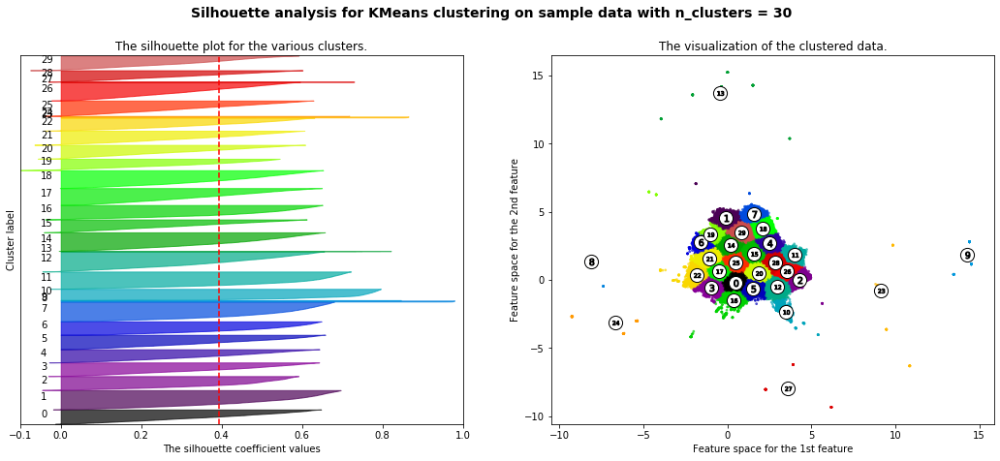

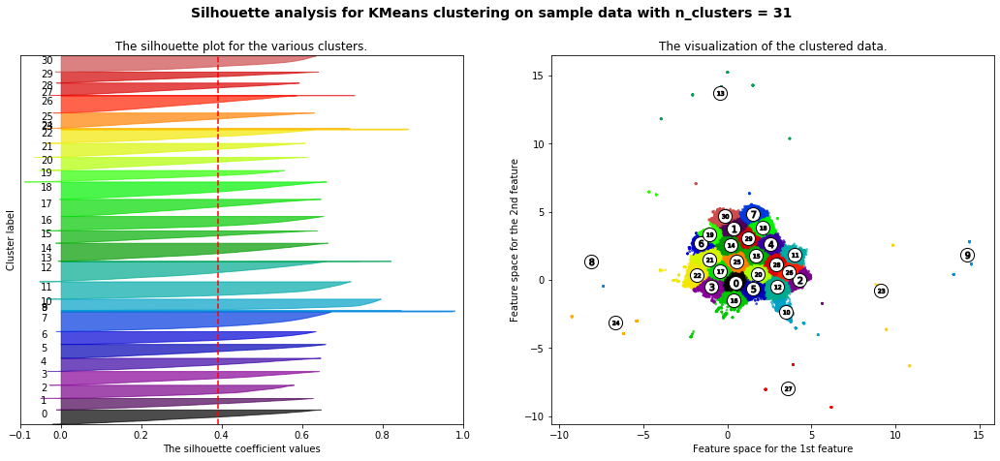

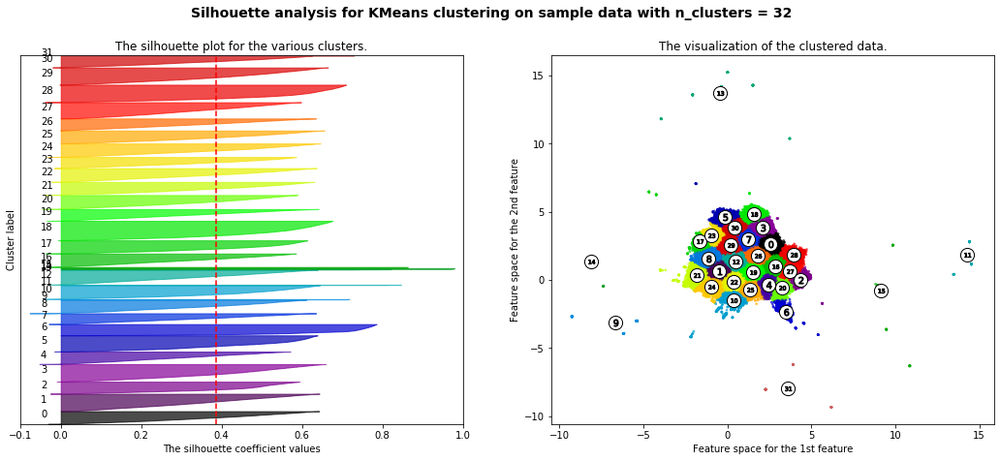

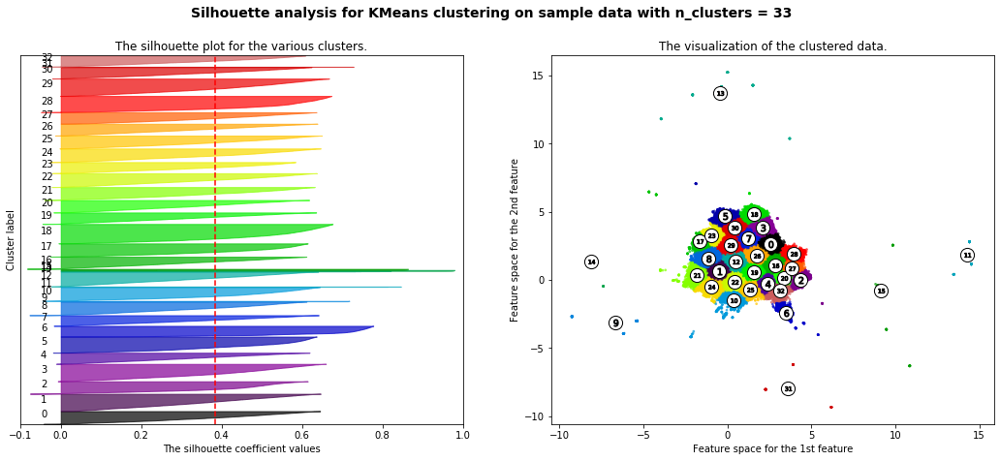

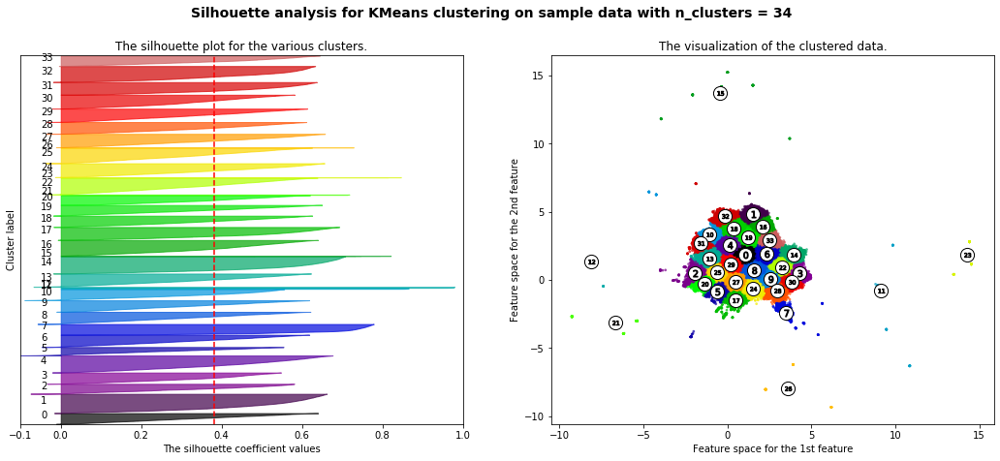

In [7]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

for n_clusters in range(4,35):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(data_reduced) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(data_reduced)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(data_reduced, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(data_reduced, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(data_reduced[:, 0], data_reduced[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

## Analyzing with narrative

In [10]:
number_clusters = 27
km = KMeans(n_clusters=number_clusters,init='k-means++')
indexes = km.fit_predict(data_reduced)
centroids = km.cluster_centers_

df_index = pd.DataFrame(indexes)

indici = []
for i in range(0,len(indexes)):
    indici.append(i)
df1 = df_index.set_index(pd.Index(indici))
df2 = df.set_index(pd.Index(indici))
df_result = pd.concat([df1,df2], axis = 1)
print(df_result)

        0  Row No Date received                  Product  \
0      24    6874      09/09/16              Payday loan   
1      19   10840      08/07/15            Consumer Loan   
2      24   12248      08/07/16            Consumer Loan   
3      24   17162      05/26/16            Consumer Loan   
4      24   17642      11/05/15            Consumer Loan   
...    ..     ...           ...                      ...   
58030  12  222826      09/21/16  Bank account or service   
58031  20  142174      03/05/16  Bank account or service   
58032  20   55888      01/23/17  Bank account or service   
58033   2  293505      09/27/16  Bank account or service   
58034   7  327087      09/28/15  Bank account or service   

                      Sub-product                                     Issue  \
0                            None  Charged fees or interest I didn't expect   
1                    Vehicle loan       Problems when you are unable to pay   
2                    Vehicle loan         

Cluster number: 0
i started a payday loan with that was then switched to bigpictureloans com the loans was initiated on and the funds were receveid on the loans was for and i expected to pay a finance charge of which would be paid back in payments of and payment of the repayments were schduled to begin on and continue every two weeks when the fourth payment was pulled on for another and not i contacted the lender who then informed me the loan was actually at an apr with a total finance charge of i told them i had only agreed to a total finance charge of i also let them know i had checked with the maryland commissioner of financial regulation and the small loan rate cap for md is per month or per year basically making their loan illegal i then requested the return the extra that was pulled on the last payment and requested they show the loan as paid in full i then let them know they had hours to meet my request or i would go to the commissioner i also let them know no other ach withdraw

paid off a loan with ocwen in the amount of by wire on since that time they have sent new payoff quotes each time increasing the amount due they have assessed a property maintenance expense in the amount of of which accrued in and after the closing i was at that property every day and no representative from ocwen ever showed up there i spent a fortune preparing that property for sale there was no maintenance i was in possession of the property ocwen has deliberately and wilfully suspended this payment refusing to properly apply it to the loan and clear the amount all the while accruing interest and charging a fraudulent fee of i

not willing to work with me to reduced my monthly payment i pay over a month most of which goes directly to interest not the principle only a few dollars each month is applied to principle my interest rates are outrageous and variable 

the interest has quadrupled my payment and put me soo far behind i am unable to repay the debt was not explained thoroughly a

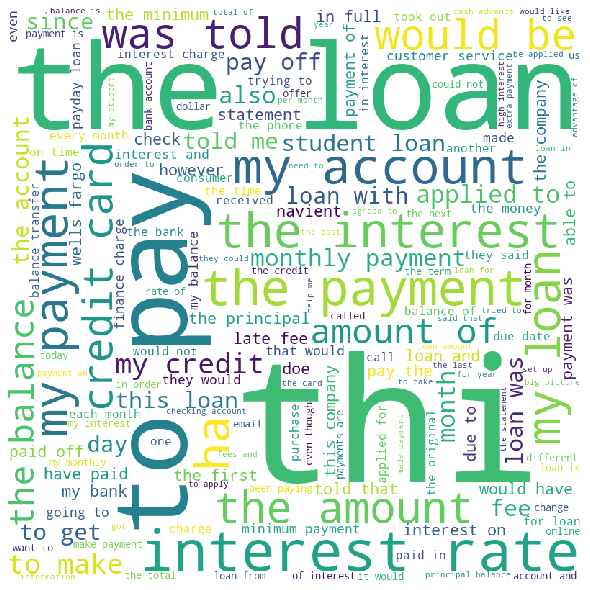

Cluster number: 1
in i moved to be with my father a va veteran i moved from to nv and informed infiniti via phone to update the billing address on file so that the payment would work apparently the lady that helped me never completed the address change once i got the forwarded late payment notice from the usps mail forwarding i had set up i paid the payment to the car i called and asked if they could wave it since it was their fault the refused i was never late like that i pay my bills i have credit utilization now this late payment is stopping me from getting a fhava loan for my house i want the late payment removed since i was technically helping a vet who served his country for years my dad has since passed and he would want me to stand up for what is right here do the right thing infiniti remove this year old day late payment on a car i bought and payed off clean as a whistle 

a few months ago i received a voice message apparently was about my barclay credit card i returned their 

Number of entries: 2419


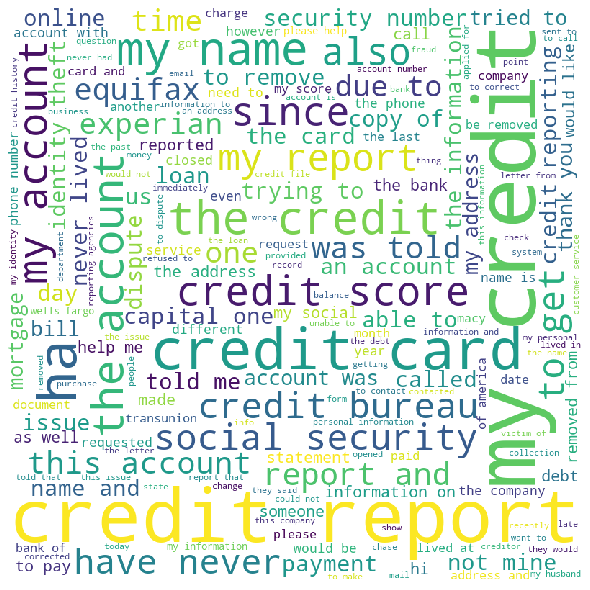

Cluster number: 2
i enrolled in a high deductible health insurance plan through my employer effective i opened an hsa with around on i decided to fund my hsa by completing a one time partial rollover of cash from my traditional ira at capital one investing i submitted a transfer form which i received from and had my signature notarized by a notary at a office since i m a member capital one received the form and refused to process because the form did not include a medallion signature stamp i tried to submit the from a second time and took the form to my personal bank representative told me the transfer form does not require a medallion signature stamp because the funds being transferred were not securities but fidc insured cash agreed to guarantee my signature and stamp the form which they explained is similar to a medallion guarantee stamp captial one refused to process the second request to reansfer funds to my hsa because they said the form lacked the medallion guarantee stamp as a 

on i went to the atm to withdraw from my account it was declined because there was only available on this day i withdrew the on i had a however i received a notice from bank of america stating that i had overdrew my account by how is this possible when i could n t withdraw my account by i visited the bank and filled out paperwork disputing the charges i was told everything was ok i have since tried to open an account and have been declined and was told that i could n t open an account nowhere in the united states this was told to me by an employee of consumer finance i ask that you please help me in this situation it is not fair that i am being wrongfully accused of an action i did not caused this has drastically hurt me i have been homeless and hungry at the time in question and could have really helped me this situation has caused me pain and suffering 

my payment was duplicated via ach by sychrony bank they will not return funds via ach i was told we have no process for that i was 

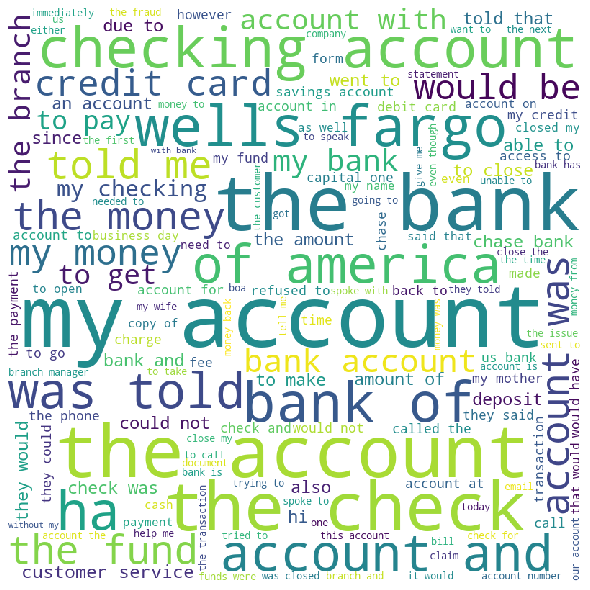

Cluster number: 3
i received a loan from world finance and and lost my job and tried to use the credit life protection that was included in my loan and was denied and sent to collection now i have mutiply collection account when i was enrolled in a service i could n t receive

when my car was repossessed late saturday night i called westlake financial all day monday and the representative that day disconnected the call all times i located another number and got the sister company and they transferred me to customer service for westlake advised me that my department was gone early for the night i requested to speak to a supervisor to report my representative for the day she transferred me over after saying that a supervisor was not there when i asked her are you there being unsupervised she then found a supervisor and adamantly stated that because it is not the collections department the supervisor would not be able to access my account or provide any account info i reiterated that i ju

on my wife and i closed on a va home mortgage when we closed we were informed by the closing attorney that our property taxes are being establish based on a normal tax year our initial escrow payment paid at closing was for home owners insurance and for one year of property taxes our home was a new construction loan so at the time the taxes were accessed the lot was vacant we were informed this was a possibility by our closing attorney the property tax bill was and is due our home owners insurance was paid in full for one year on which left the for property taxes when i received the property tax bill i called the loan originator and was informed that the loan was sold to round point mortgage servicing corporation and would be effective i called to speak with them and was informed that they could not perform any action until after they have officially assumed the loan however the payment would still be due to them on that date on i made my mortgage payment which was processed on and inc


 accounts are closedsold to a new company and no longer valid record accounts transferredsold transferred to another lender 

my loan repayment on was recalculated by pennsylvania higher education assistance agency for the year and they did not include my wife s loan in their calculation causing a much higher amount to be deducted than necessary my student loan payment for my loan jumped from to the amount they debited however in was my wife s loan increased from to this increase was due to a failure on my part to confirm her updated yearly certification i received one email and no reminders from dept of ed to finish the process this difference of is significant i m working jobs to try and keep my head above water my salary as a federal attorney has lost ground when compared to health insurance premium increases and property tax increases in county md i work part time on the weekends at but that additional income only increases the amount i m expected to pay on my student loan creatin

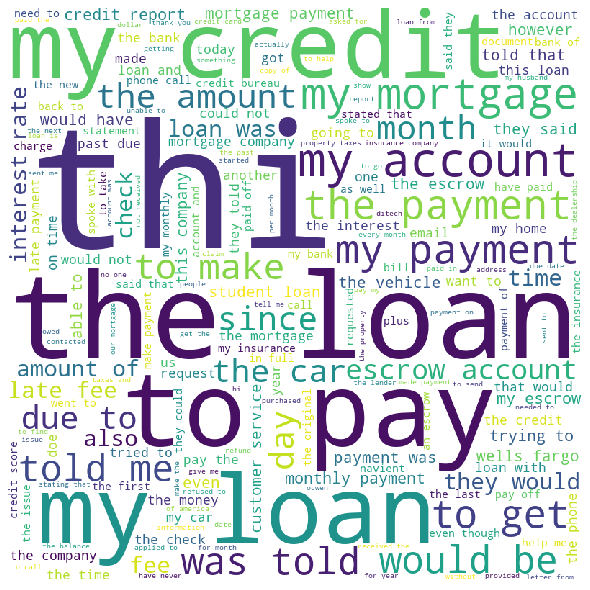

Cluster number: 4
i have of bank of america credit cards is power rewardssignature visa is cash rewards signature visa bank of americacredit department closed my both account without any notice and all of mycash or power points rewards are forfeited i do not violate any t cs of credit card agreement or rewards program rule and both of my credit card account remains in good standing i want bank of america refund all cash or power rewards to me

due to american express amex not properly crediting my account for a disputed balance totaling after repeated written request with supporting documentation that the disputed balance of should be credit in full i cancelled my amex account in writing on prior to the account cancellation i wrote amex on and requested that they transfer all my past and future membership rewards points to my existing amex account this is fully allowed in the amex mr terms and conditions under the section titled forfeiting and getting points back for canceling your acc

denied a promotional offer for new money in a savings acctg major bank with minor customer service latest response was that i was ineligible due to not receiving offer in mail while i was offered this promotion in person from their bank representative have spent several visits to branch office hours on the phone and countless time with chats and emails with extremely long turn around time for any answers to this problem was told in branch that this unfortunately business as usual and i am one of many with similar problem with same representative 

Number of entries: 1787


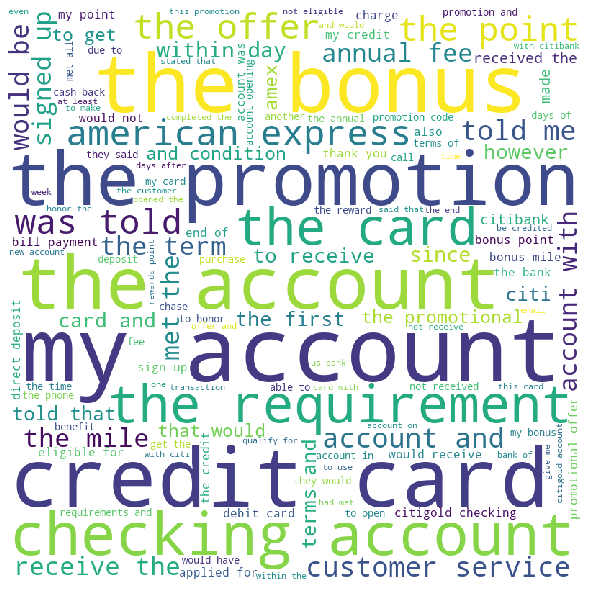

Cluster number: 5
i am writing to you requesting assistance with a continued discrepancy and conflict with a previous creditor i previously filed a request for validation made pursuant to usc g sec b of the fdcpa with santander consumer finance usa i made it explicit that it was not a request for verification or proof of my mailing address but a complete competent legal validation of the accuracy of information reported to my credit profile for entries made by santander consumer usa at and i have not received this validation or a correcting of my credit profile to date this issue arises from an account i originally initiated with roadloans com for an auto loan in that was subsequently transferred to santander consumer usa the roadloans com account only ever reported to my credit profile the date of first delinquency for the account with roadloans com was following a period of delinquency with roadloans com from to the account was transferred to santander consumer usa the account was ne

this debt reported by credit protection association is not a valid debt i submitted a letter to their company on requesting that i be sent several specific documents that prove i owe this debt credit protection association did not respond to my request i have attached a copy of the letter in addition this debt is over years old and can no longer be reported to the credit bureaus according to the fair credit reporting law 

through cfpb closed this account explanation of closure terminated collection efforts and notified the bureaus to delete our trade line case 

credit reporting agency experian would not validate any information for accounts that i have asked for validation of on separate occasions by law they must validate with documentation any accounts that are reporting to my credit report but they have not complied with my requests 

i need assistance with getting incorrect information removed my credit file i have sent certified mail to all credit bureau and reporting agency and

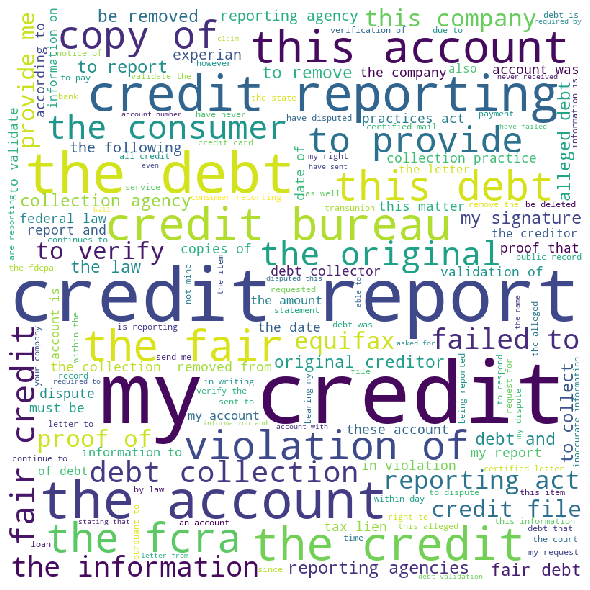

Cluster number: 6
i was shocked when i reviewed my credit report and found late payment on the dates below days past due i am not sure how this happened i believe that i had made my payments to you when i received my statements my only thought is that my monthly statement did not get to me also if you look at the attached screen shot of my report they are saying was late two months and that is true on they are reporting days late and on and they are reporting days late 

Number of entries: 168


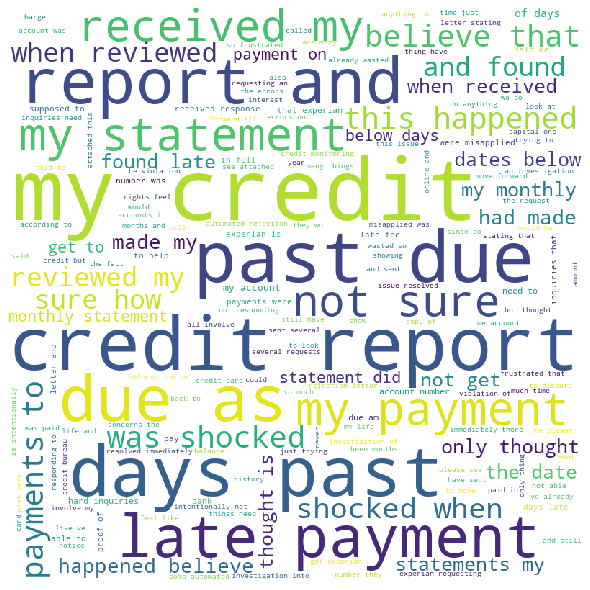

Cluster number: 7
i recently was funded by capital one through financing for a new motorcycle that i purchased on a week later i get a letter in the mail from them with instruction on how to log in to my new credit card account manage and pay my monthly payments upon receiving this letter from them with a financing card in the envelope i realized that capital one had financed the motorcycle for me by signing me up for a new credit card instead of with a loan a week later i check my credit score and find that i have now been hit with a point credit score loss because my credit card utilization rate is now awful because of this new credit card via capital one nowhere during the financing process did the dealership or capital one make it clear to me that i was being financed through a credit card instead of through a loan and now because of this my credit score went from being great to being poor 

a credit card was opened with my name and social security number the credit card company is

best buycitibank cards is trying to rebill me for something that happened several months ago i filed a dispute because i returned a tv for i provided proof that it was returned via usps and they re now re billing me for it when the dispute was filed back in according to the law a bank or company has up to days to resolve a dispute that time frame has passed also i have contacted them several times about this and they re refusing to work with me this is n t the first time they ve done this to me 

i submitted a request for removal of pmi from my mortgage loan with bb t for my primary residence on with my request i submitted an appraisal from a licensed and certified residential real estate appraiser showing my current ltv ratio was substantially below the required my request was denied with no reason provided i called bb t customer service but they are unable to assist as the mortgage insurance office is a back office function and does not interact with customers i submitted a formal co

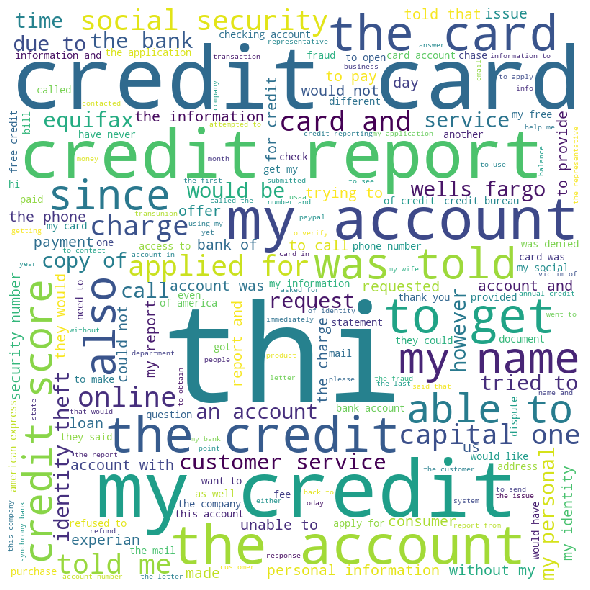

Cluster number: 8
almost months ago my loan was purchased by residential credit solutions at the time my mortgage payment was roughly four months after rcs had my loan my payment increased to for escrow purposes i spoke with my town about a rise in taxes that did n t happen and my insurance for the year had already been paid rcs claimed that i had to be charged but never truly explained why i kept up with my payments monthly until as a single mother of and a home owner unexpected financial expenses came up and had to be taken care of so i sent my payment in and rcs sent it back to me and said that my loan is in default because i was deliquent with payments that i am heading for foreclosure that they will not accept anything less than the payments and that they will ruin my credit i was advised that my only option is to refinance the loan as soon as possible and get away from the company the problem is that they are now saying that i am payments delinquent and they are holding those pay

i have been applying for a loan modification with nationstar mortgage for the past year and still have not been able to get nationstar to review my documents i have completed all documents and nationstar has verified they have been accepted except for my profit and loss statement thus i redid the profit and loss statement and sent it back to them again nationstar has sent me a request for yet another and not reviewed my modification this has been repeated five times now since i have done a year to date and and submitted it four times in months i fear that all of my other documents for the loan modification they have accepted will soon expire while this delay is taking place 

contour mortgage who is a approved lender has been holding up the loan with minor details i have extended the purchase twice with the seller and now moving into a third extension which will now cost me day until the closing numerous attempts to rectify any and all problems but emails and phone calls go unanswered 

 we were scammed by a company offering to get us a modification of our arm mortgage our mortgage servicer at that time was ahmsi we received approval for our mod made our first three trial payments on time then were informed by ahmsi that we were denied after being approved sending in our signed notarized copies and receiving back the signed copy from ahmsi because they had not received required documents income tax returns that had been sent in numerous times including the copies given to their field representative in person who sent them via ups red with a tracking number after that they tried to foreclose on us at that point i contacted hud who contacted ahmsi and they agreed to do an inhouse modification and though the terms were not as advantageous we agreed to out of fear of losing our home we made the three payments but after that when trying to make a payment by phone our payment was rejected the operator informing us that we were in pre foreclosure it took two more years befor

Number of entries: 3261


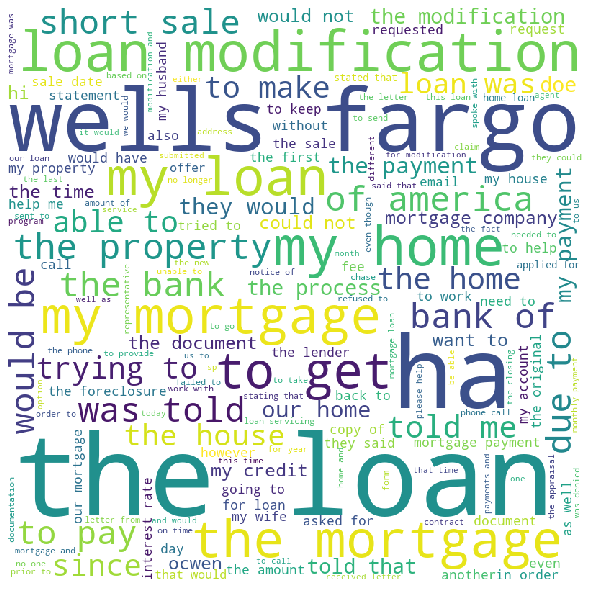

Cluster number: 9
navy federal credit union has issued loans in my name to my spouse i discovered these debts in i am currently pending a divorce and have filed a criminal complaint against my spouse for forging loans and taking credit cards in my name total accounts at approx and filed a divorce in in montana navy federal s loans issued in my name have helped to destroy my credit rating and i am in their collections department for a loan that i did not authorize to be taken out or take out i have reported to navy federal credit union that the loans are fraudulent and forged as i never authorized them or signed them or gave signature authority to my spouse or anyone else to take them i have provided affidavits to navy federal credit union telling them of the fraud they will do nothing and are coming after me in collections i obtained the forged promissory notes from navy federal credit union in and i can not get any assistance from them and they claim that the loans are not fraudulent 

the questions they asked me i answered them correctly to my knowledge and couldnt get report might be fraud

the description of my credit activity is not mine 

i am a victim of identity theft my sister took my cards to accounts with pnc bank she knew my pin because she knows i use the same pin for everything se withdrew cash we look a lot alike and the bank would not credit that back to me when they looked at film she changed her to look like mine there was in debits that were made by her that i have disputed and they are not returning everything and the are putting my accounts in the negative this is not my fault i should n t have to pay for what was done to me i should receive my credits because i had n t used my card since because i had them closed 

i went to call my bank account information today at wells fargo and they told me my account is closed my local branch here in told me i had to open a new one now after a month of it being open it is now closed i did n t receive anythin

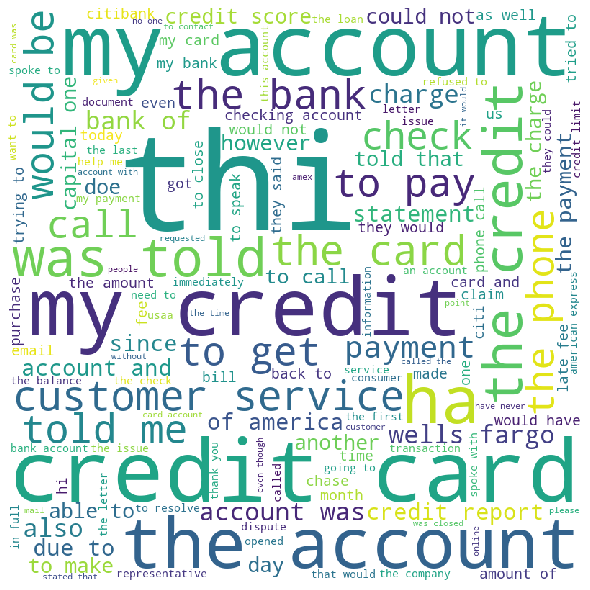

Cluster number: 10
should be marked as other mainly sands recovery is a debt buyer who has chosen a path of purchasing debt accounts without properly validating such debts there is no debt here no chain of title back to the lender it is unclear if they sold the debt or assigned it to a separate company for servicing sands and should be looked into for not validating the accounts prior to selling to the next entity 

back a while i had gotten a payday loan my bank account info had been compromised by someone i made a report to the ftc regarding it i had to make a few changes to my account and payments being made from it i became delienquit with my payments i received a call from a claiming to be from he stated that they were after persons who were defrauding theses payday loan companies since my account was considered delienquit they had my account info if i paid the out of court restitution it would be done i made payments before i noticed something s in the paperwork that did n t seem

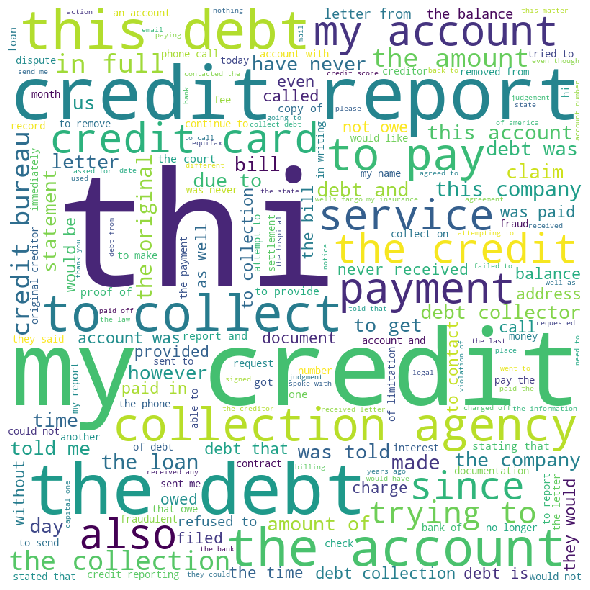

Cluster number: 11
Number of entries: 161


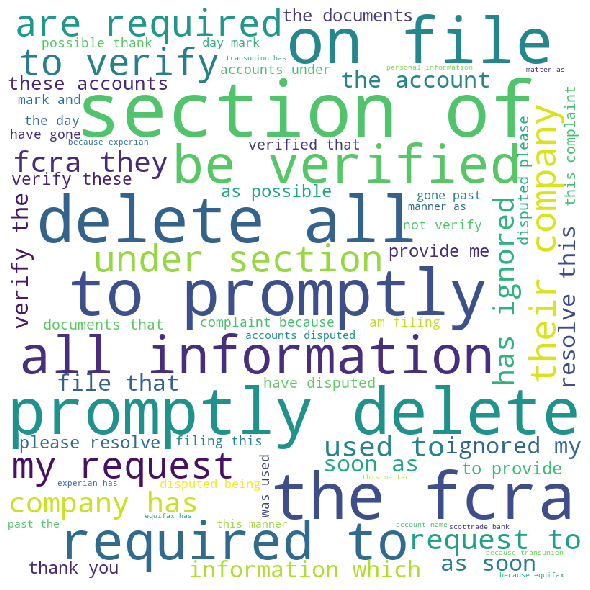

Cluster number: 12
see previous complaint for initial details my account was attempted to be debited twice speedy cash stated in was impossible for them to have attempted a second deduction i sent bank information proving my account was attempted a second time regardless of what they claimed in their answer i received an email back from them stating they would refund any fees associated with their error after days this was a contradiction to what they were stating before when they were refusing to issue a credit even though it was verified as an error on their side speedy cash finally issued one credit however they failed to issue a second credit for and i have now incurred a negative balance fee from my bank 

back in when i was busy with school work and volunteer activities i was talked into signing up for a second credit card with chase bank and told that this was a smart move to help build credit i was told that this card came with overdraft protection to protect overdrafts from my


i opened a svingschecking account and a line of credit with the citizens bank i was told that there will be no maintenance fee if i had a direct deposit and keep the line of credit open i always met both of these conditions of the bank i had a less than loan in my line of credit account and therefore paid annual fee separately for this reason the citizens bank has charged me per month fee for months when i complained they reimbursed only for months however this maintenance fee is totally bogus as i have always met the bank s conditions i have tried to speak with the bank a couple of times sent complain online but they do not care to resolve my issue and reimburse my remaining this is an unscrupulous and deceiving practice of the bank to rip off customers like me and they are not willing to resolve it 

i was traveling for work last week and had unknowing overdrafted my account with fifth third bank i was n t informed about this and instead was charged per charge on my card most of whi

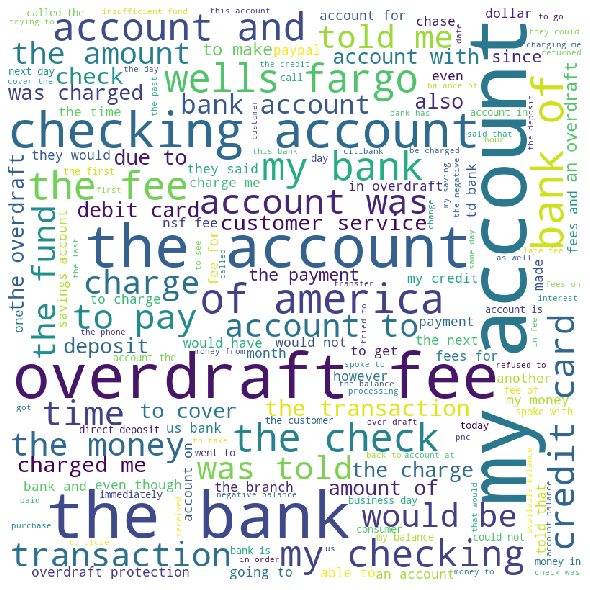

Cluster number: 13
dear cfpb officials and financial service providers i am prompted to write this complaint because through no fault of my own i have been effectively barred from the financial industry and the costs of being un banked are simply enormous even though i continue to earn money i am paid via u s checks and despite trying every bank that i could reach none of them would cash the check without me first opening a checking account and although i have tried opening a checking account at more than separate us banks i continued to be denied access to even the most basic checking or savings account generally speaking these banks do not tell me why i am denied just that they have made a business decision to not offer their services to me although i continue to receive targeted advertising offers in the mail through email etc i have lived for a while now paying excessive fees to have my checks cashed via special check cashing businesses but the fees are outrageous and the time spen

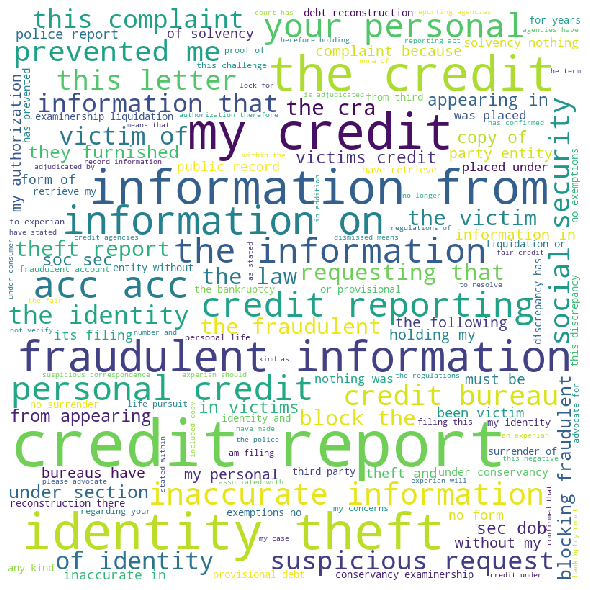

Cluster number: 14
have been trying to modify for the last three years every time i try documents go missing and things are delayed i ve been turned down a few times but am told that i may apply again for a different program i ve been told that my principle would be dropped and many other things that were lies when i was finally approved the conditions were outrageous i just want a fare modification so i can get back on track this company has been me around for years and i am suspicious of their accounting as well as far as my account goes 

i was told by university that my degree was accredited and would be accepted anywhere i have been turned down by multiple jobs due to not accepting degree from i graduated in have attempted to find jobs to fit my degree with no luck i am now stuck paying back the loans with amounts i can not possibly afford monthly and never being able to use my degree 

i was mandated to make monthly payments to genesis lending on my private student loans while at

i was speaking with sallie mae on repayment options as i was unemployed following graduation i was unable to meet the +month payment and was asking what my other options were i was specifically advised to let my account run over as in not meet the payments because sallie mae would not work with me on changing payment options until i was overdue after two months i tried to reach customer service once again and was directed to collections who informed me that i had to make my loans current before i could begin any sort of payment change option after explaining the advice i was previously given i was given a sorry and an adamant ultimatum that they needed to make the loan current first before anything could be done i was forced to borrow money from my parents and then was explained the options available to me neither of which greatly affected my payments i was also reported to the credit bureau due to the non payment of the loan which has affected my credit score making it difficult to no

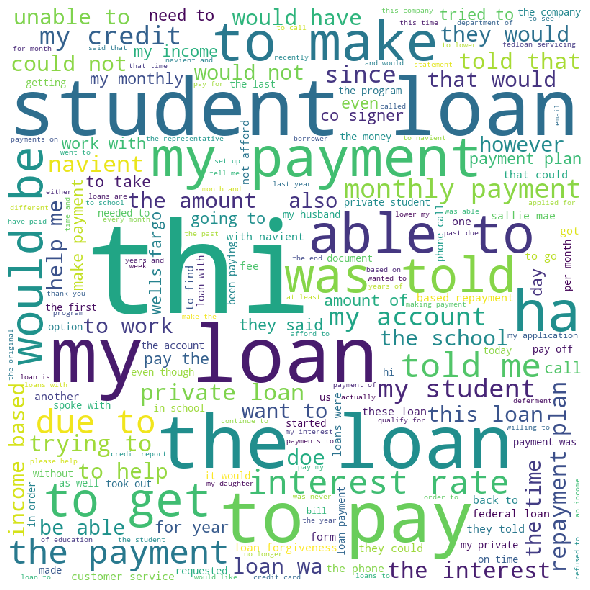

Cluster number: 15
i am currently being harassed by email from loan companies cashcall they are threatening to sue garnish my check i only applied for a loan with cashcall paid the loan then cashcall said i still owe them dollars i filed a complaint they said they wrote it off on my credit report these orther i have never applied for a loan nor have i received anything from them i tried emailing them letting them know these are fraudulent but no reply next i tried calling them at these numbers not reachable please please please help me thanks 

toyota financial services tfs calls us incessantly from various outward bound call centers using fake direct inward dial numbers furthermore they are calling a distant family relation at which they have no right to do as they are not a party to the purchase contract i would like tfs to cease and desist all collections activity with my distant relatives and only communicate with my wife and i directly 

one click cash keeps contacting me after se


allied interstate llc is contacting me in an unprofessional manner they call me monday thru sunday at all hours of the day calls come in at all hours of the day and night it is extremely annoying and upsetting i had already made payment arrangements with bank the credit card company now they re sending me these people to supposedly collect a debt 

i am currently in the process of settling my credit card debt with multiple creditors through american express has begun to call my friends and family asking to get in contact with me i realize this is legal but american express has called my sister who is not a consigner of american express twice and has disclosed that this regarding past due debt given this illegal tactic recommended i reach out to you to submit a complaint i am hoping you can help given they ve called more than once to the same person and disclosed my debt 

after being laid off and struggling to get bills paid on time i contacted navy federal credit union for assistance

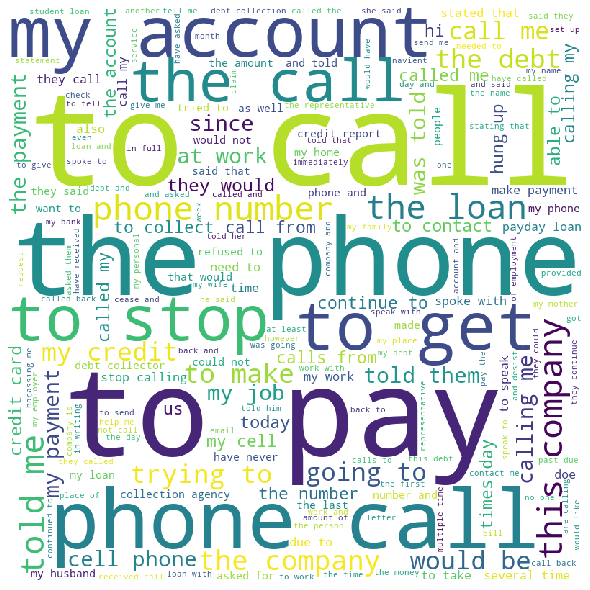

Cluster number: 16
i received a prepaid small business master card debit card in the mail that was unsolicited from netspend i ve never heard of this company and have not applied for a debitcredit card this company is sending debit cards to people where their identity can be stolen in the future the card indicated that i needed to activate the debit card 

my car dealer told me to pay the dmv which i did however i had already paid and the dmv sent me back the check bank of america took it out of my account and then will not give it back though i ve called six times to have it given back additionally i filed a claim with bank of america due to fraud at a postal center while i sent a sculpture they charged my card fraudulently after quoting me dollars bank of america honored their fraud and gave them the money even though i never allowed it to go through nor did i approve the price they signed it wihtout my permission 

i have regular amex and a prepaid amex my prepaid amex ends in amex 


i purchased airline tickets on airline for a flight on with a credit card in the amount of when attempting to take the trip said that the bank declined the payment and it was necessary to purchase the tickets again the airline tickets were purchased again for travel on with a chase credit card but the tickets now cost after the trip i followed up with and they confirmed that the purchase was valid and that did get paid i opened a dispute with chase for the amount of afterwards refunded to chase not i followed up with chase and explained that the more expensive amount needed to be refunded in full chase informed me that the dispute remained open and nothing was due on the card chase subsequently charged me a late fee of and has indicated that payment is past due on my credit card 

my wife and i went on a cruise to we went into a retail jewelry store we saw a white gold diamond pendant we told the sales people that my wife wanted a yellow gold diamond pendant the sales people told us t

barclay arrival card cancelled card with no reason and took over points is this legal 

from american express business credit card marketing proceduresi have been an amex customer since and pleased with service until i start getting unwanted solicitations for a business line of credit **for a business i have no association with** when i call they tell me it will take three months to correct the error in the mean time every two weeks i get an invitation to open a line of credit with this erroneous business opt out procedures typically are days waiting days is unacceptable i have nothing to do with the business they assigned me to every mailing is a risk people go through mail and take credit card offers and steal identity change addresses and open accounts fraudulently when i explained this to amex they stated sorry it takes days i dont understand how i was associated with university in the first place i have enjoyed amex over years but these erroneous mailings every two weeks not only 

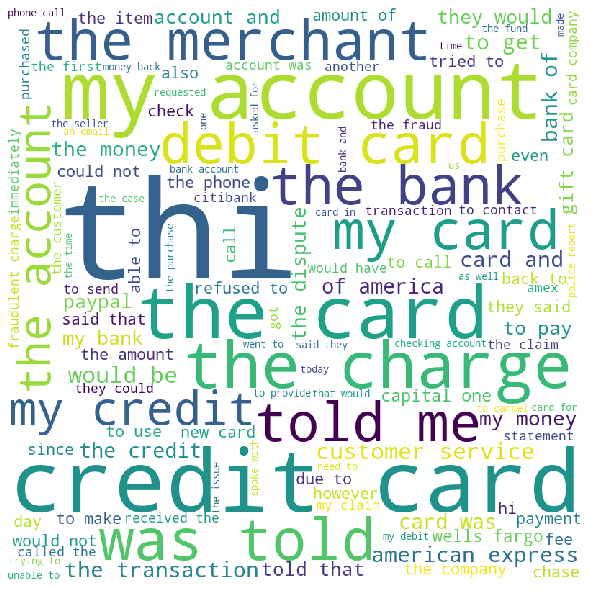

Cluster number: 17
Number of entries: 86


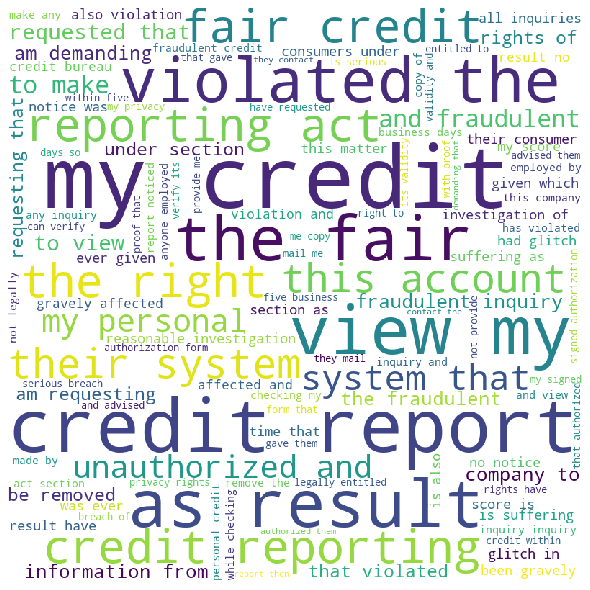

Cluster number: 18
b discover fin svcs laccount number ut phone dear sir or madam i am a victim of identity theft an identity thief used my personal information without my permission to open an account several account in my name this debt is not mine i have enclosed proof of my identity and a copy of my identity theft report in accordance with the fair debt collection practices act i am asking you to stop collection proceedings against me and stop communicating with me about this debt except as the fair credit reporting act allows i also ask that you notify b discover fin svcs l or any company associate with this account and tell them the debt is the result of identity theft i have enclosed a copy of the federal trade commission s police report notice to furnishers of information it explains your responsibilities under the fair credit reporting act fcra the fcra requires that debt collectors give an identity theft victim documents related to an account if the victim asks please send me

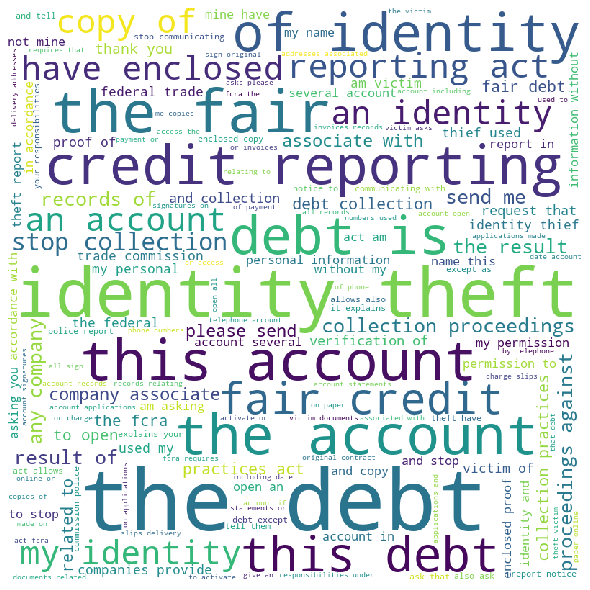

Cluster number: 19
i am utterly disgusted at conns home f urnishings i purchased a new k sm art tv from them yesterday at and they ran my credit and took my money up front i paid to get the loan to get the tv i got the tv home and left it safely there unharmed until my work day finished then i unpackaged it and set it up it was wonderful until half way through the first movie on the left hand side of the tv a blue line appeared needless to say i called conns and they said i needed to call the repair center they could not replace the tv they can send someone to repair it i could not call the repair center as they were closed so i called they did some simple test and they told me they could also send someone out to fix my tv i said no way i paid for a new tv and i should get a replacement asap they said the repair team would have to determine if that is the best option for me i told them it paid for a new tv and that s what i am getting period i asked to speak to manager and they are sup

i check my balance today at discover it it displyed the following information also in the from as an attachment from the website last statement balance recent transactions recent payment and credits current balance i am not sure how you do that math how can you add to and arrive at that is just incorrect and discover is trying to deceive customers how are they off by now discover might state that it is because of pending transactions however that is not true also included in the transaction is all of the current pending transactions you will notice that this total is so i will give discover the benefit that my current balance may include pending transactions but that still means there is a difference of additionally discover gives the definition of current balance to say your current balance is the total of all transactions posted to your account as of the previous business day please note the key words of posted and that there is no mention of pending in that statement this informatio

ther are debts and almost all of them i do n t recognize i need them off my credit score 

i have had loans with aes and for some reason they had accounts for me i would log into each account online and pay in they had my birthday wrong and i faxed them my birth certificate and other documents they said the problem was fixed i continued to pay in they locked me out of my account we called to resolve the issue and they said i did not have accounts and that they could not find the account we were locked out of and wanted me to fax my documents i faxed everything and then in made another phone call and asked to pay the balance and for them to resolve my online access they would not tell me how much i owed to be able to pay it they sent me a letter saying the account was past due i called again in to ask what i owed and they said that the account no longer existed and they had merged both accounts then on a debt collector called me to say that my account was days delinquent i was not aware

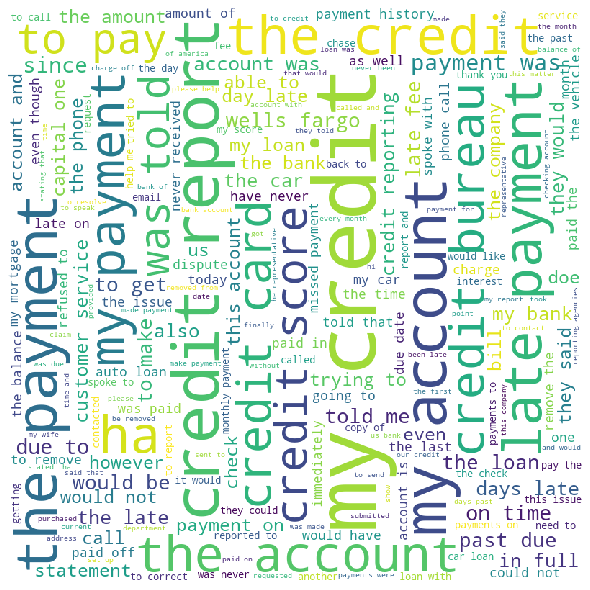

Cluster number: 20
this complaint is a duplicate of the complaint filed by the same date herewith and are the account holders purpose of complaint delete or correct the late payment reported with the major credit reporting agencies and credit agencies concerning the payment pnc bank has refused to delete or correct this information in spite of their unfair and fraudulent practices set forth below the payment was due on the amount due was this payment was not made and a late fee was assessed along with interest however during the month of pnc s website reported an affirmative next scheduled payment dated in the amount of when in fact no payment was scheduled the account holders reasonably relied upon this information and did not take additional steps to satisfy the payment believing that either a payment had been affirmatively scheduled by them or that the account was enrolled in automatic deduction when the fictitious next scheduled payment in the amount of was not made on as indicated

i am having issues with cco mortgage corp sending my escrow back on a mortgage that paid off i have an envelope showing that i had the payoff sent to my new address and i have contacted the bank and my address has been changed since cco mortgage is saying that i never changed my address and they are saying i did not and even if it is changed at the bank mortgage is a separate company and have no responciblity to look in to it i am now being told they will not reissue a check until days after it was sent out and then they have additional days to mail it out also they do not have to transfer me to a supervisor 

carrington mortgage bought out our loan from in we did receive a letter from stating that our mortgage was moving over to carrington but never received information from carrington on how to pay my bill as my payment was due and by i still had n t received a notice i called carrington mortgage to find out that they had n t even put the account through the system and it would be up

Number of entries: 2850


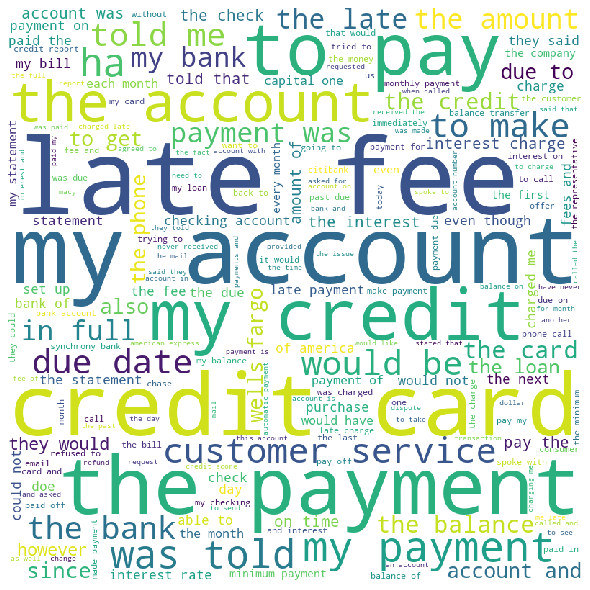

Cluster number: 21
consumer has made a previous complaint to cfpb about diversified consultants in which they responded with lies consumer e mailed diversified consultants to inquire as to its reason for placing a statute of limitations barred bogus wireless bill on both my and credit reports the rep responded that the account could not be located and requested i send my name and address to verify the account of course i refused the rep first asked for the last digits of my ss that i provided dci was quick to place this bogus item on my credit reports but can not find the account in their records and quick to respond with lies to the first cfpb complaint 

i have asked experian to delete wrong personal information from my report and they have fail to do what i have requested to do 

credit reporting agency says they verified a bankruptcy on my credit file they refused to identify the source of the validation i contacted my local federal court house and was informed that they do not ver

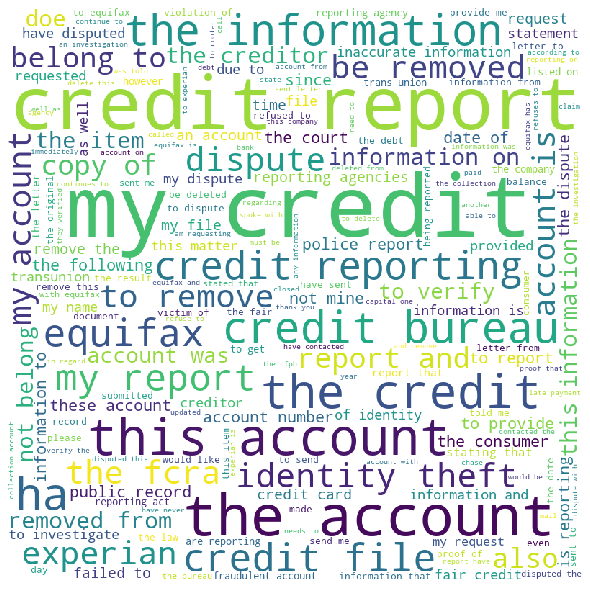

Cluster number: 22
my payroll check is deposited on this card weekly i was informed by rushcard that system updates would take place on monday at it is friday at i have no access to my funds i can not withdraw or make purchases with my card my money is being held hostage day maybe but we have rights this cant be legal 

i requested bank of america to refund me which i lost due to boa refusing to act on a fraud claim boa refuses to log my request for a refund statement of facts on i made the purchase in good faith from another bank of america customer i thought if the person is using the same bank as me i should be safe i realized i was scammed about mins after i made the online transfer i contacted bank of america right away and reported the fraud transfers take days to be available in the recepient s account bank of america refused to stop the transfer and also refused to investigate further i logged a police complaint with police the scammer came into the branch and withdrew the fund

Number of entries: 3061


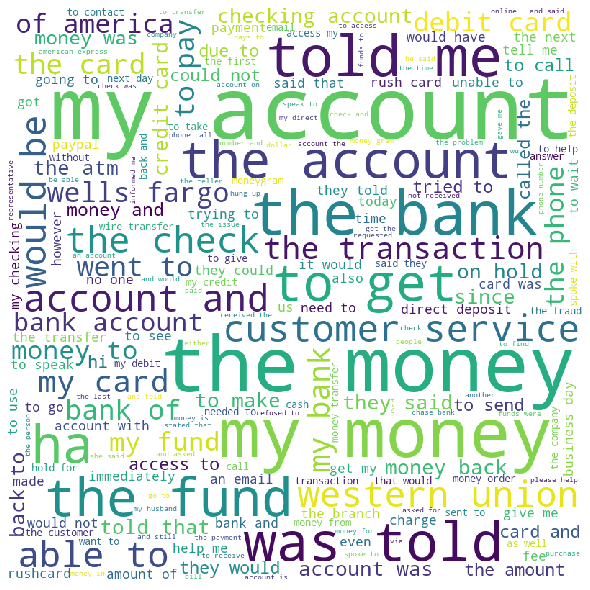

Cluster number: 23
on we went in to look at new vehicles when we found the one we wanted we explained that if they could not find financing within the bank hit on our credit and within the correct finance charges we were willing to pay that we would return the following day with our own financing once our bank opened the following morning when we went into the financing office they notified us they hit our credit score times i was furious when we were about to sign off on the car we noticed the interest rate was points higher than we had agreed to pay they had to adjust the selling price to get us approved by the bank at the lower rate the next day i checked my credit report and noticed they had hard hits on my credit i contacted the dealership and they said there was nothing they could do that sometimes their computer just keeps searching until it finds a bank to finance it none of this is what we originally agreed upon i had financing i could ve received from my bank the following da

they keep stating that the information is what they received i contacted and equifax mortgage and they were supposed to remove these inquiries from equifax which are not authorizzed i wrote previously there are hard inquiries from dated and and neither are mine as i do not have an account nor have i ever used or applied service i have reported to and equifax and they removed previous hard inquiries but these remain on my credit file also there are from equifax mortgage dated and and i reported to them and they still have not removed although via phone they acknowledged they were not mine i never requested any mortgage from equifax mortgage they say it is but i do not have a relationship nor have i requested mortgage through i have reported to and still nothing resolved 

tried to open a credit union account in ca was told that there was a freeze placed on my social security number in relation with my credit due to a fraud alert which i did not submit but which was submitted through exp

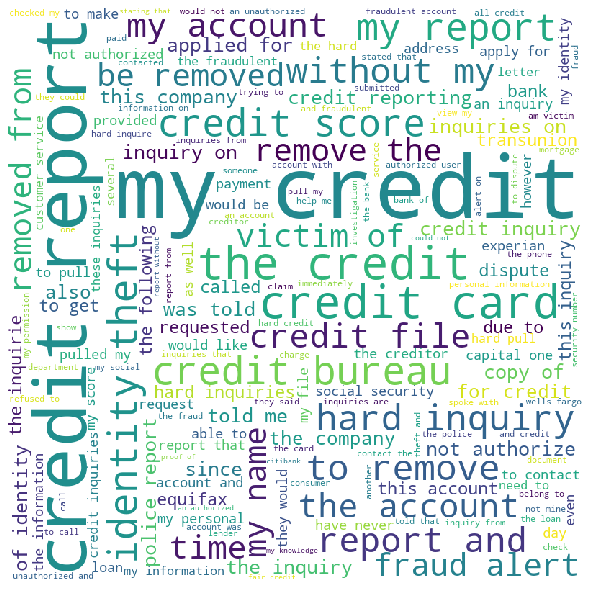

Cluster number: 24
in i asked ford if i could transfer my loan through ford credit ford focus which i purchased in the in i told the person i spoke to my credit was not very high and i was working on it he told me i may be able to obtain another loan and to bring in all my finance information i provided him with my veterans affairs letter which shows my and asked him to ask ford credit for the loan at this time i was considering a new car as i was working with veterans affairs since my to obtain employment and i was ready to beginning to explore moving out of new jersey the sales person collected my info and came back saying the other loan companies denied me based on credit however i did not ask him to conduct a credit check as i stated above i asked him to have ford credit consider this eventually after perhaps a half hour he said they did during this time i was which has since improved the medication i was on with veterans affairs i did not feel was appropriate as i have experienced

my account was paid off and refinanced with a different finance company the finance company overpaid what was owed on the account i m being told that the over payment will be returned to me in days from to make sure there are no liens and paperwork is taken care of i honestly do n t believe that to be an acceptable time frame for this to happen 

i took a leaser from nissan motor acceptance corp in and i agreed to a month lease with me dealer lied and deceived me wrote the contract at months and did not notify they changed the terms based on what we agreed to verbally even though i only agreed to months at i paid all months and they told me when i moved to forced me to double pay upfront taxes i had already paid at the beginning of the loan and now pay per month which was not in my written contract i was over charged and lied to on this loan then after i returned the leased vehicle in perfect condition and they said i didnt owe anything they have wrote me up on the credit bureaus as a 

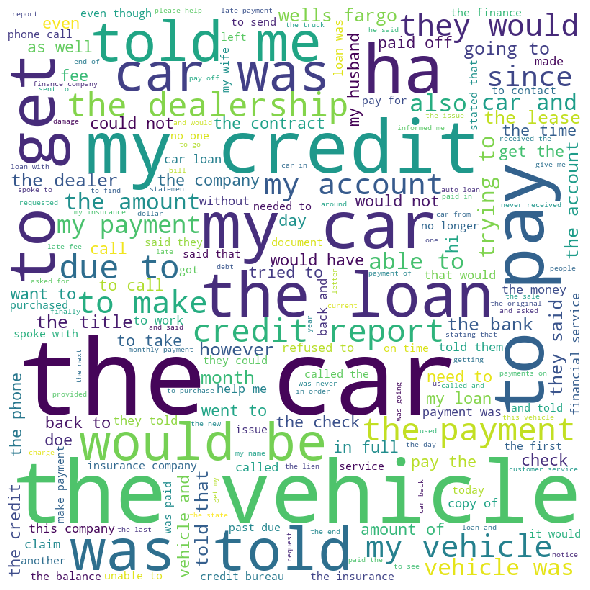

Cluster number: 25
Number of entries: 37


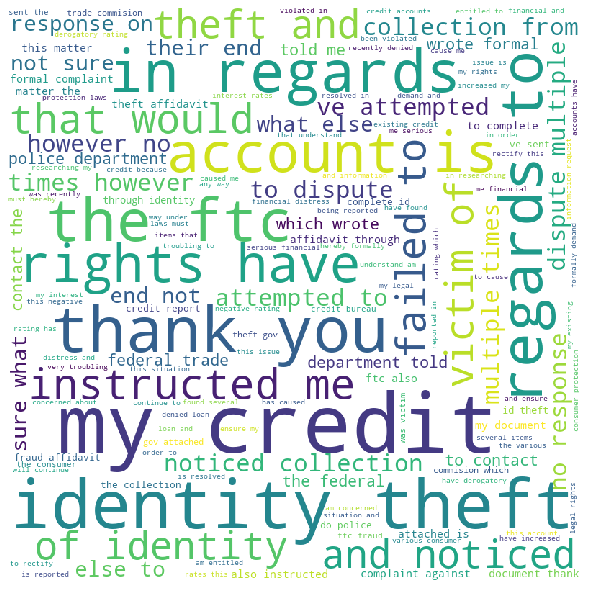

Cluster number: 26
i got a loan from instaloan equity auto loan on report in ga the manager there gave me information that shows paid in full this account is only on my report on my report there is a closed account with a balance they have put different accounts on my credit report with different balances showing that i have to pay those in full for and i disputed it twice showing that there were duplicate accounts open closed the account for now shows balance and closed they said they contacted instaloan and was told my account was still open which is not true because i paid it in full so i have closed account showing with the same account number and an open account with another account number i paid off the balance in full everytime that i would go into to make a minimum payment they would re open a new account i called corporate about them updating my credit report and was told that the district manager would contact me i told them that i want my credit report updated correctly and 

Number of entries: 3016


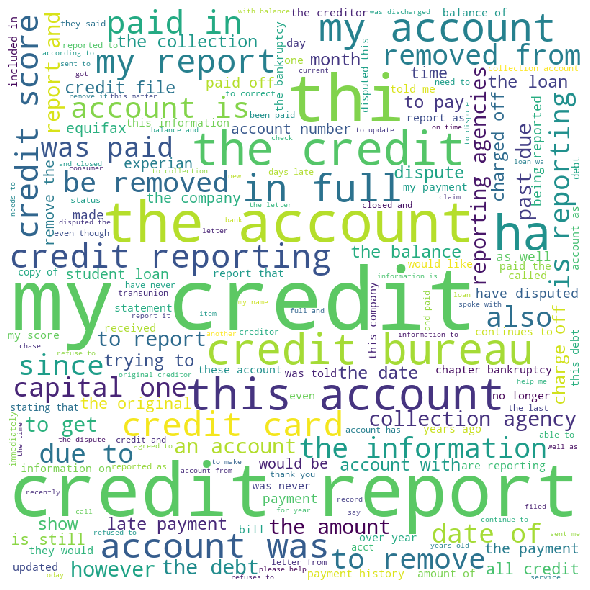

In [11]:
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords
import random

#if it's your first time running with these stopwords, run the following line aswell:
#nltk.download('stopwords')

stopwords = set(stopwords.words('english'))
stopwords.add('xx')
stopwords.add('wa')

for i in range(0,number_clusters):
    all_words = ''
    print('Cluster number: '+str(i))
    amount = 0
    for index, row in df_result.iterrows():
        if row[0] == i:
            all_words += ' ' + row['Consumer complaint narrative']
            rand = random.randint(1,200)
            amount += 1
            if(rand == 1):
                print(row['Consumer complaint narrative'] + '\n')
    wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(all_words) 
    print('Number of entries: ' + str(amount))
    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.show() 


## Visualizing clusters

In [ ]:
import seaborn as sns
_labels = pd.DataFrame(indexes)
labels = _labels.rename(columns={0: 'label'}) 

_reduced = pd.DataFrame(data_reduced)
reduced = _reduced.rename(columns={0: 'x', 1: 'y'}) 

clusters = pd.concat([reduced, labels], axis = 1)


facet = sns.lmplot(data=clusters, x='x', y='y', hue='label', 
                   fit_reg=False, legend=True, legend_out=True)
